# Projet_S2 présenté par Abdoulaye MBAYE

In [132]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report


In [85]:
# Importing the dataset
data = pd.read_csv('Laptop2024.csv')

In [87]:
data = data.iloc[:, 1:]

### 1- Expliquer les variables étudiées ainsi que leur degré d’importance lors de l’achat d’un nouvel ordinateur portable.

In [88]:
data

,brand,Model,Price,Rating,processor_brand,processor_tier,num_cores,num_threads,ram_memory,primary_storage_type,...,secondary_storage_type,secondary_storage_capacity,gpu_brand,gpu_type,is_touch_screen,display_size,resolution_width,resolution_height,OS,year_of_warranty
0,tecno,Tecno Megabook T1 Laptop (11th Gen Core i3/ 8G...,263.89,63,intel,core i3,2,4,8,SSD,...,No secondary storage,0,intel,integrated,False,15.6,1920,1080,windows,1
1,tecno,Tecno Megabook T1 Laptop (11th Gen Core i7/ 16...,395.89,67,intel,core i7,4,8,16,SSD,...,No secondary storage,0,intel,integrated,False,15.6,1920,1080,windows,1
2,hp,HP Victus 15-fb0157AX Gaming Laptop (AMD Ryzen...,562.10,73,amd,ryzen 5,6,12,8,SSD,...,No secondary storage,0,amd,dedicated,False,15.6,1920,1080,windows,1
3,acer,Acer Extensa EX214-53 Laptop (12th Gen Core i5...,439.89,62,intel,core i5,12,16,8,SSD,...,No secondary storage,0,intel,integrated,False,14.0,1920,1080,windows,1
4,lenovo,Lenovo V15 82KDA01BIH Laptop (AMD Ryzen 3 5300...,314.38,62,amd,ryzen 3,4,8,8,SSD,...,No secondary storage,0,amd,integrated,False,15.6,1920,1080,windows,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
986,asus,Asus Vivobook Pro 15 M6500QC-HN542WS Laptop (R...,725.89,68,amd,ryzen 5,6,12,16,SSD,...,No secondary storage,0,nvidia,dedicated,False,15.6,1920,1080,windows,1
987,msi,MSI Thin GF63 12VE-070IN Gaming Laptop (12th G...,1011.89,73,intel,core i7,10,16,16,SSD,...,No secondary storage,0,nvidia,dedicated,False,15.6,1920,1080,windows,2
988,asus,Asus Vivobook Go 15 2023 E1504FA-NJ522WS Lapto...,494.89,59,amd,ryzen 5,4,8,8,SSD,...,No secondary storage,0,amd,integrated,False,15.6,1920,1080,windows,1
989,asus,Asus Zenbook 14 2023 UM3402YA-KP541WS Laptop (...,747.89,68,amd,ryzen 5,6,12,16,SSD,...,No secondary storage,0,amd,integrated,False,14.0,2560,1600,windows,1


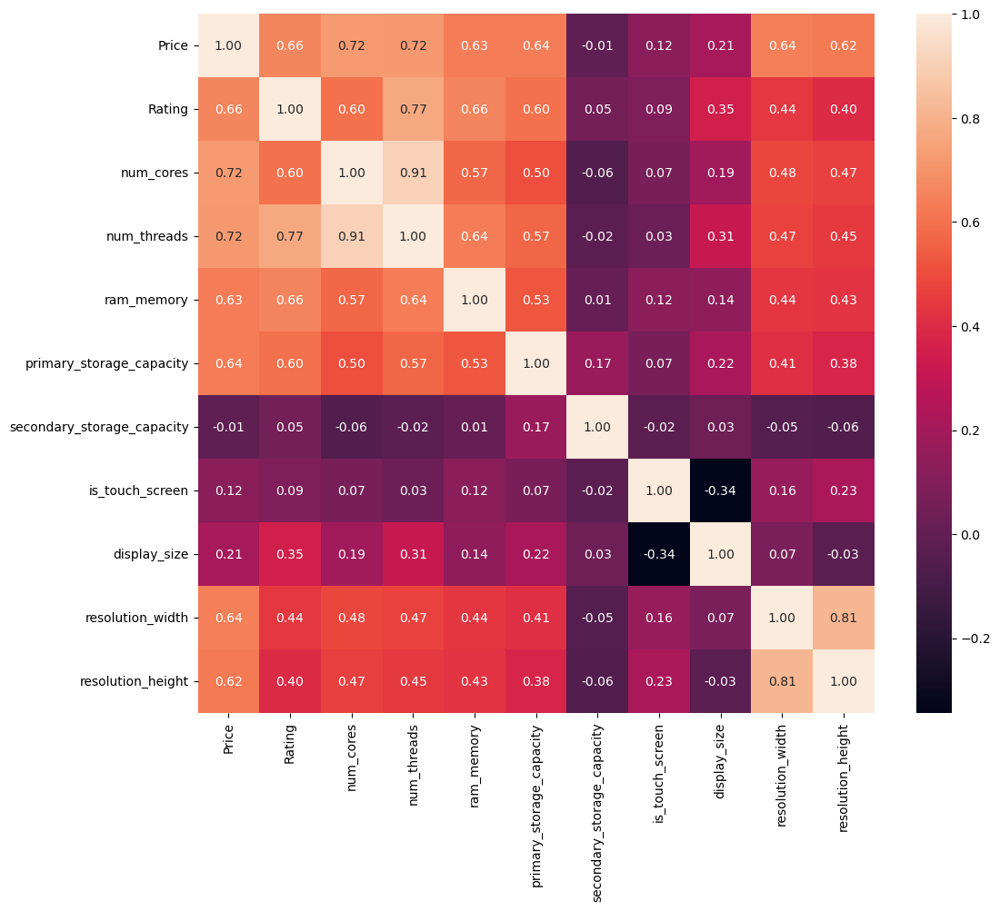

In [89]:
# Calculer la matrice de corrélation
corr_matrix = data.corr()

# Visualiser la matrice de corrélation
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f")
plt.show()

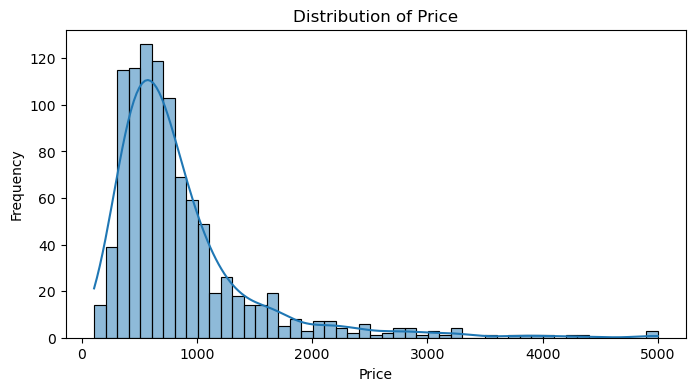

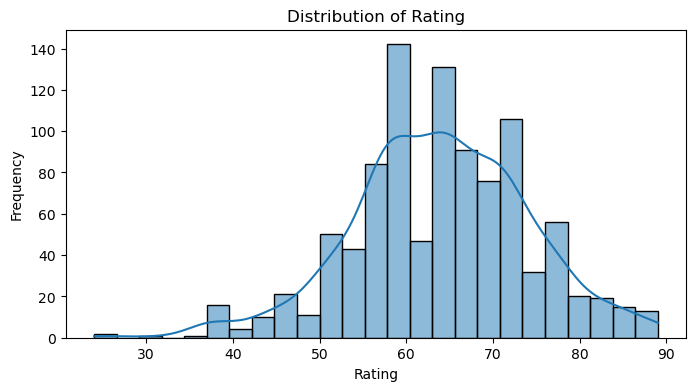

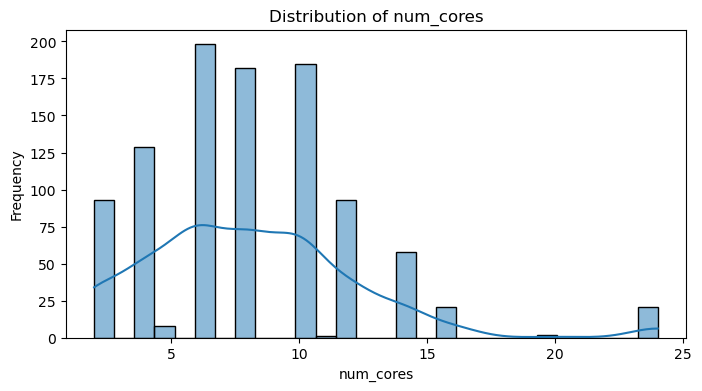

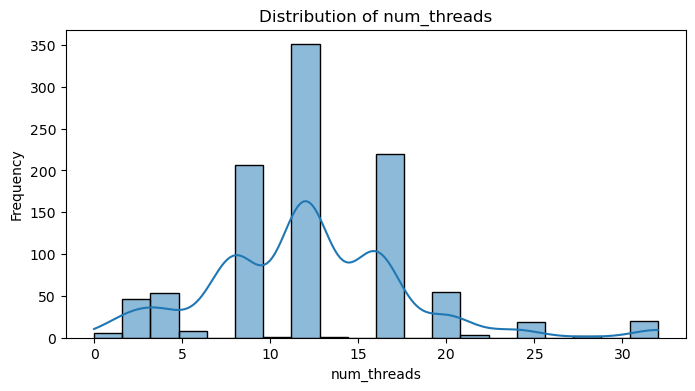

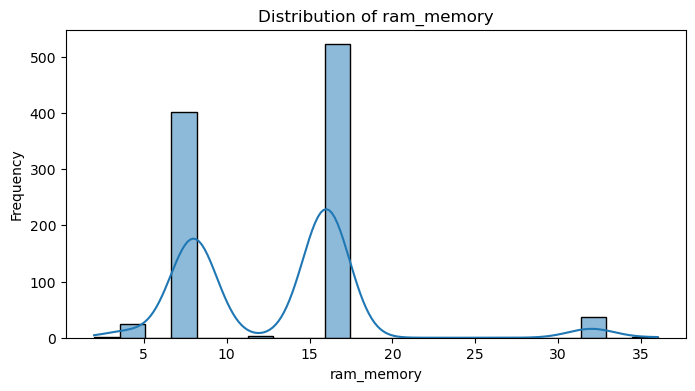

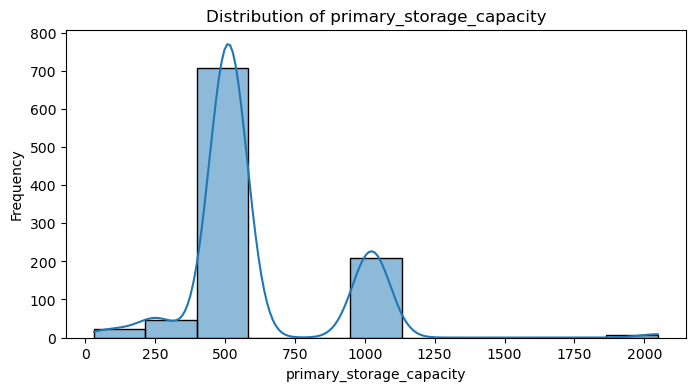

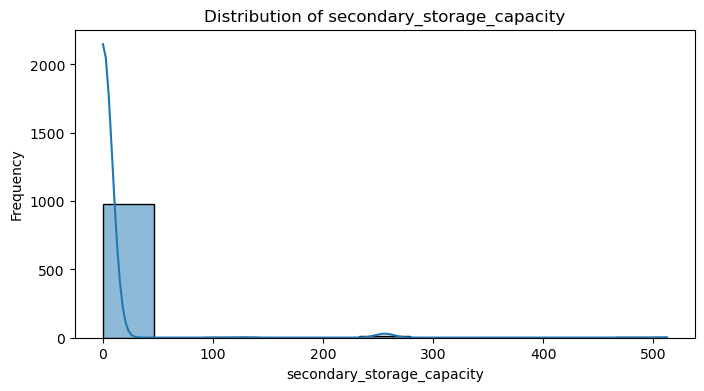

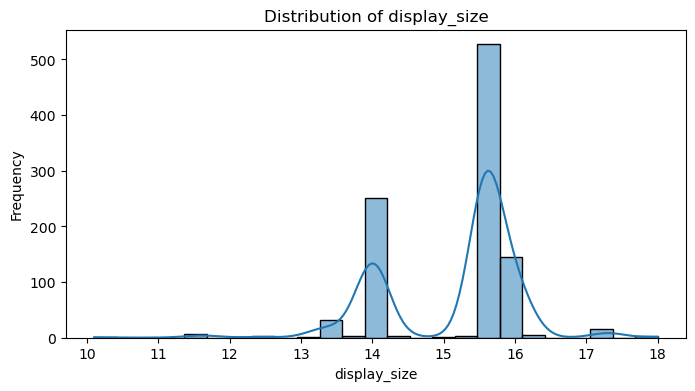

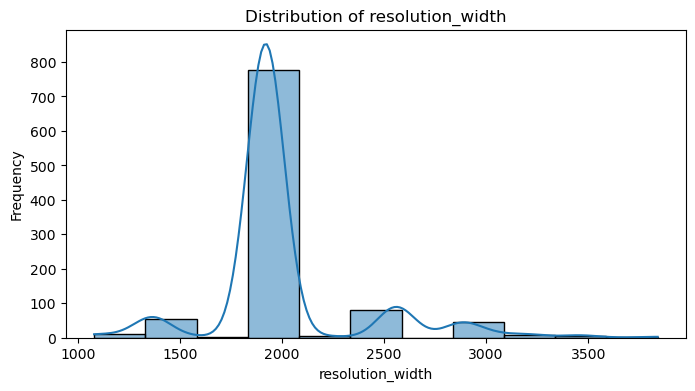

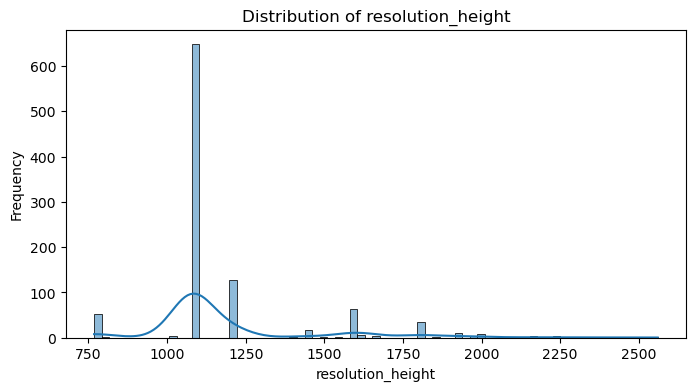

In [90]:
num_vars = data.select_dtypes(include=['int64', 'float64']).columns

for col in num_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[col], kde=True)  # `kde=True` ajoute une courbe de densité
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

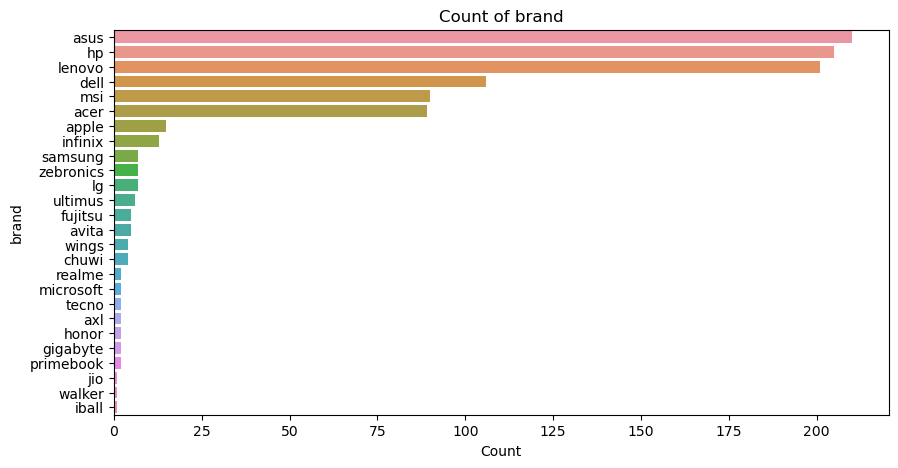

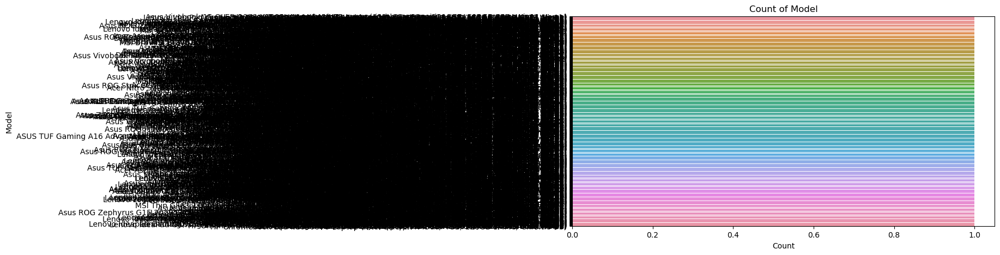

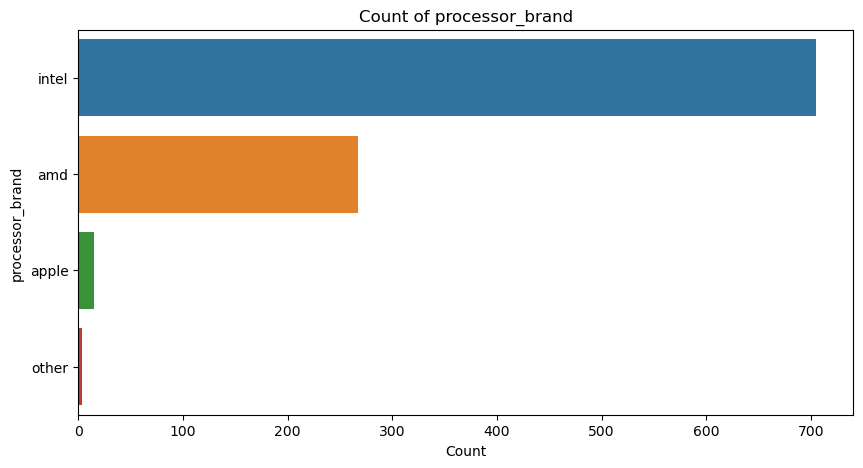

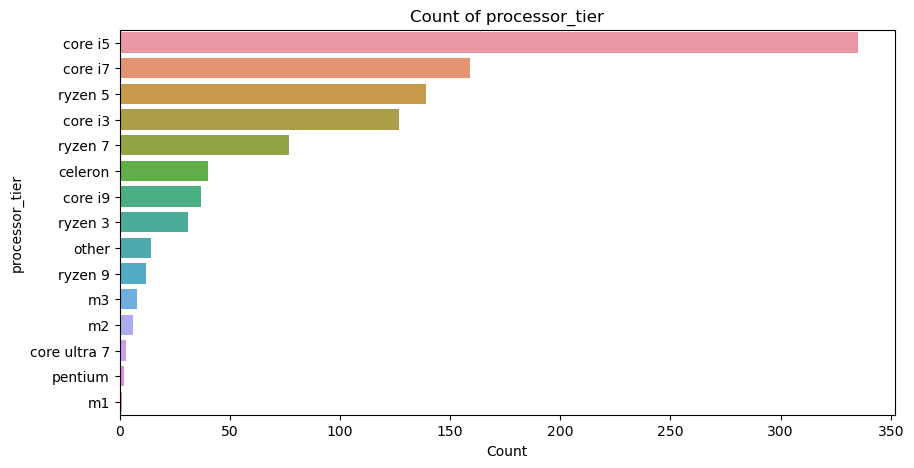

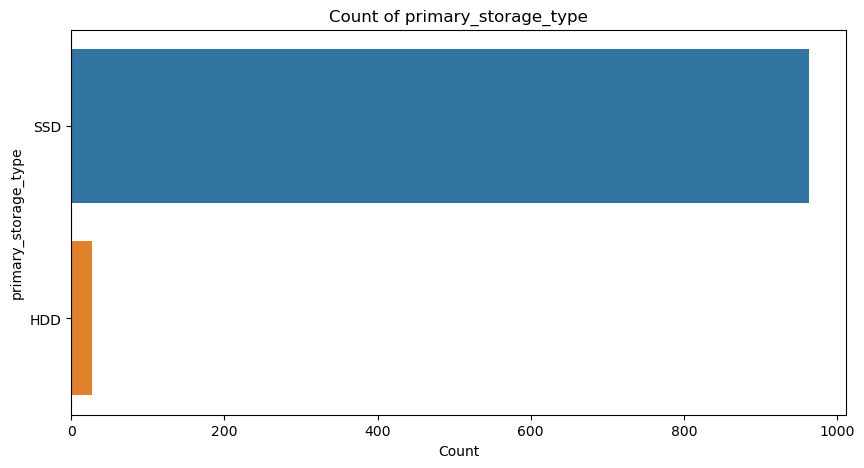

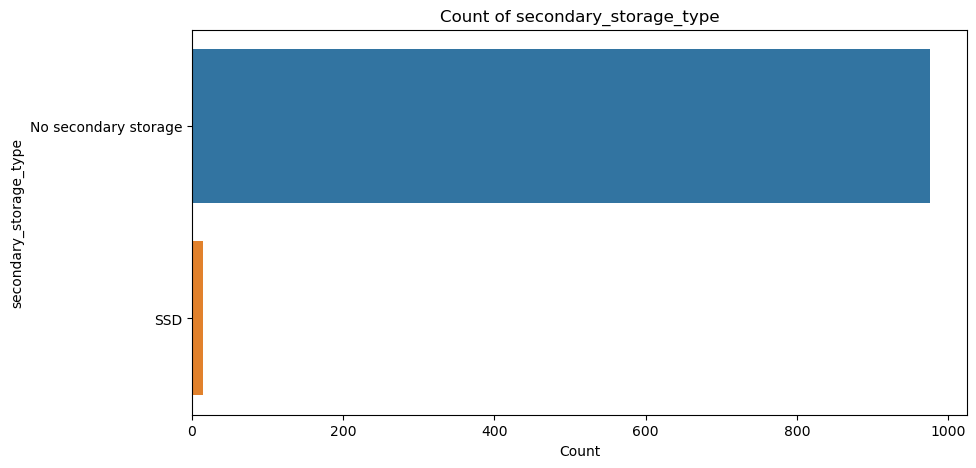

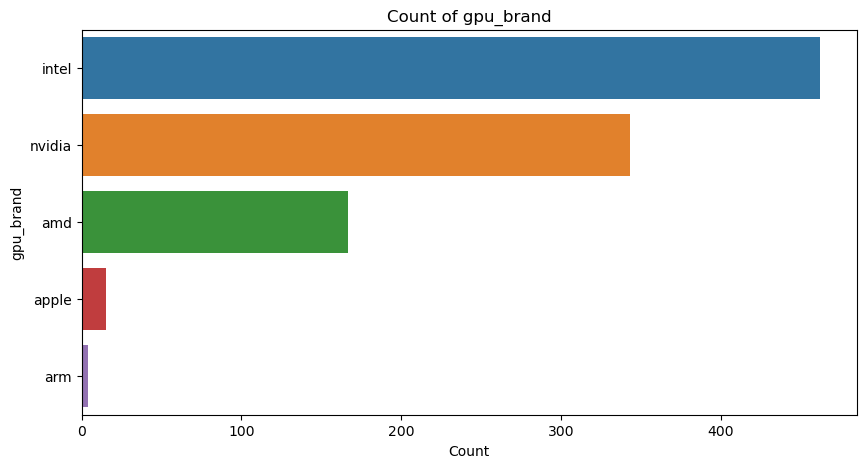

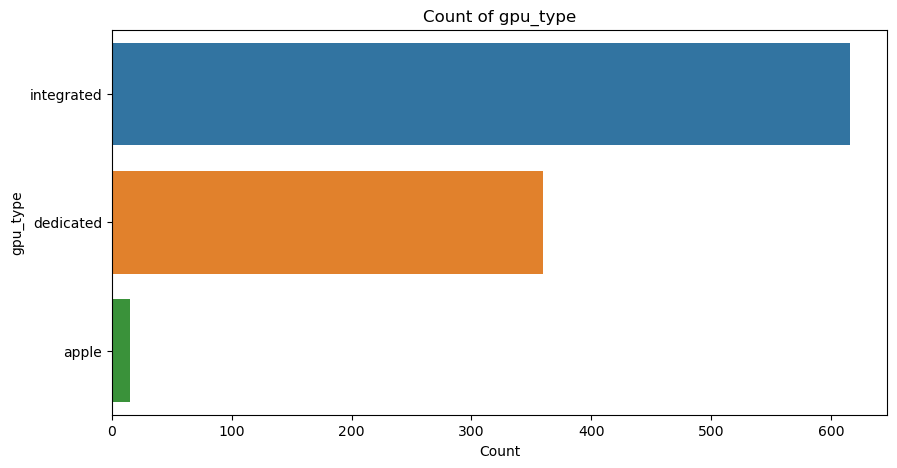

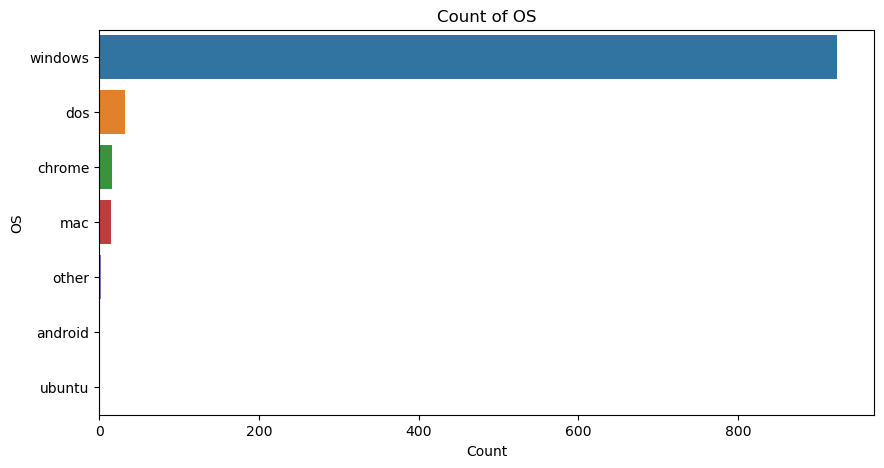

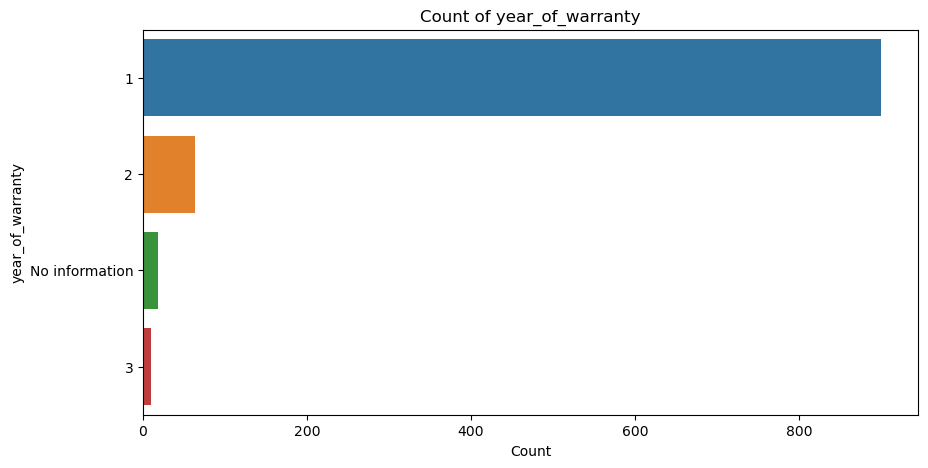

In [91]:
# Diagrammes en barres pour chaque variable catégorielle
cat_vars = data.select_dtypes(include=['object']).columns
for col in cat_vars:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=col, data=data, order = data[col].value_counts().index)
    plt.title(f'Count of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

### 2- Tirer les informations pertinentes qui se trouve dans ce jeu des données etles présenter d’une façon compréhensible par tout le monde (Représentations graphiques, tableaux synthétiques et résumés numériques).

In [92]:
# Résumé statistique pour les variables numériques
print(data.describe())


             Price      Rating   num_cores  num_threads  ram_memory  \
count   991.000000  991.000000  991.000000   991.000000  991.000000   
mean    849.931550   63.931382    8.128153    12.191726   13.047427   
std     631.234013   10.190575    4.215499     5.585115    5.591188   
min     107.800000   24.000000    2.000000     0.000000    2.000000   
25%     479.545000   58.000000    6.000000     8.000000    8.000000   
50%     680.900000   64.000000    8.000000    12.000000   16.000000   
75%     981.695000   71.000000   10.000000    16.000000   16.000000   
max    4999.390000   89.000000   24.000000    32.000000   36.000000   

       primary_storage_capacity  secondary_storage_capacity  display_size  \
count                991.000000                  991.000000    991.000000   
mean                 610.938446                    4.004036     15.171241   
std                  266.927666                   33.553936      0.938089   
min                   32.000000                    0

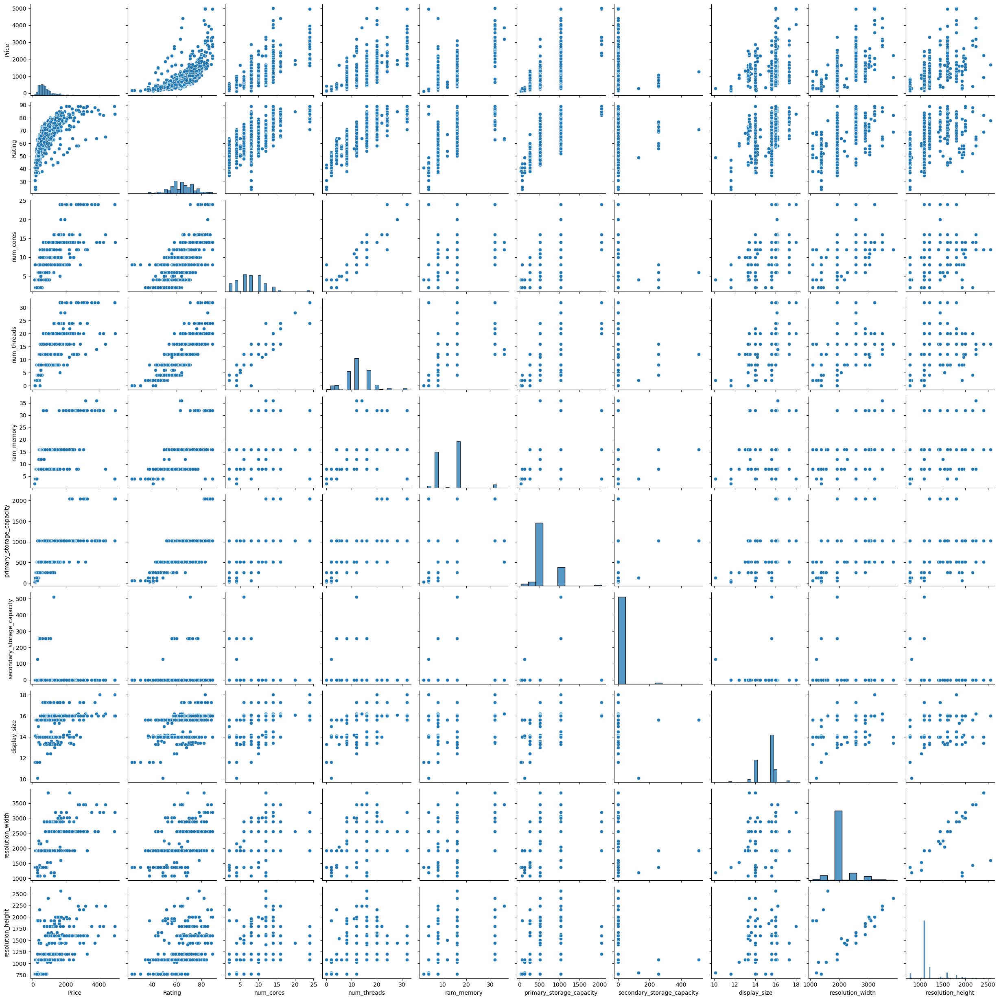

In [93]:
sns.pairplot(data.select_dtypes(include=['int64', 'float64']))
plt.show()

### 3- Etudier les liens entre les variables quantitatives, en créant des modèles d’estimation qui permettent d’estimer les variables les plus importantes comme Prix, en utilisant des modèles des modèles des régression simple et multiples.

In [94]:
# Supposons que nous voulons prédire le prix en fonction de la mémoire RAM, du nombre de cœurs du processeur, et de la taille de l'écran
features = ['Ram memory', 'Number of Cores', 'Display size']
X = data.select_dtypes(include=['int64', 'float64'])  # variables indépendantes
y = data['Price']  # variable dépendante

# Séparer les données en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [95]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Créer et entraîner le modèle de régression multiple
model = LinearRegression()
model.fit(X_train, y_train)

# Prédire les prix sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer le modèle
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R² Score:", r2)

Mean Squared Error: 7.30829918557863e-26
R² Score: 1.0


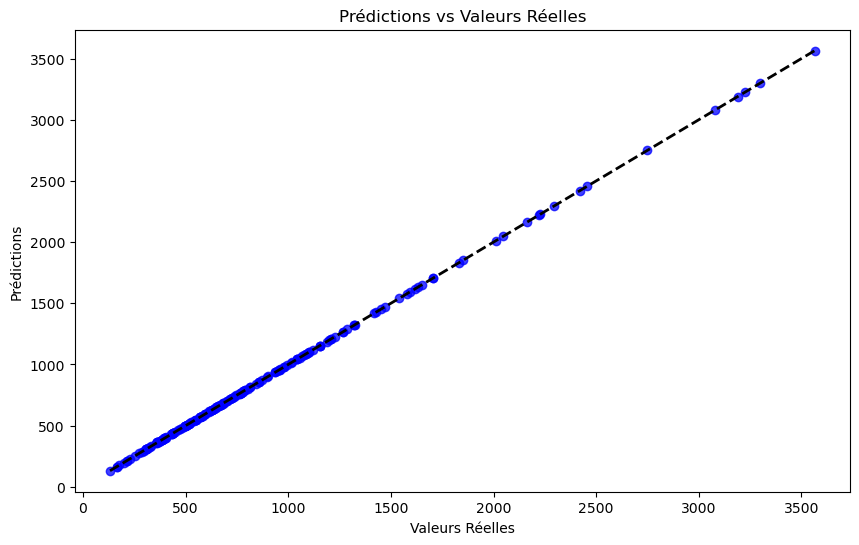

In [96]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.75, color='b')  # Prédictions en bleu
plt.xlabel('Valeurs Réelles')
plt.ylabel('Prédictions')
plt.title('Prédictions vs Valeurs Réelles')

# Tracer une ligne de parfait accord
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

In [97]:
# Régression simple pour 'Ram memory'
simple_model = LinearRegression()
X = X[['ram_memory']]
simple_model.fit(X_train[['ram_memory']], y_train)
simple_y_pred = simple_model.predict(X_test[['ram_memory']])

simple_mse = mean_squared_error(y_test, simple_y_pred)
simple_r2 = r2_score(y_test, simple_y_pred)

print("Simple Model - Mean Squared Error:", simple_mse)
print("Simple Model - R² Score:", simple_r2)

Simple Model - Mean Squared Error: 133579.21170527383
Simple Model - R² Score: 0.6538247603739008


### 4- Etudier les liens entre les variables qualitatives en réalisant une AFC dans les cas de dépendance.

In [ ]:
# Charger les données
data = pd.read_csv('Laptop2024.csv')

# Pour chaque variable quantitative, testez si les moyennes diffèrent par catégorie
# Exemple avec 'Price' en fonction de 'Brand'
fvalue, pvalue = stats.f_oneway(*[data[data['brand'] == brand]['Price'] for brand in data['brand'].unique()])
print(f"F-Value: {fvalue}, P-Value: {pvalue}")


In [101]:
# Séparer les variables quantitatives et qualitatives
quantitative_vars = data.select_dtypes(include=['int64', 'float64']).columns
qualitative_vars = data.select_dtypes(include=['object']).columns


results = []
for qual_var in qualitative_vars:
    for quant_var in quantitative_vars:
        grouped_data = [data[data[qual_var] == level][quant_var] for level in data[qual_var].unique()]
        f_value, p_value = stats.f_oneway(*grouped_data)
        results.append((qual_var, quant_var, f_value, p_value))

# Convertir les résultats en DataFrame pour une meilleure lisibilité
anova_results = pd.DataFrame(results, columns=['Qualitative Variable', 'Quantitative Variable', 'F-Value', 'P-Value'])

# Afficher les résultats
print(anova_results.sort_values(by='P-Value'))


/Users/zigzeug/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:3877: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  warnings.warn(stats.DegenerateDataWarning(msg))


      Qualitative Variable       Quantitative Variable       F-Value  \
56  secondary_storage_type  secondary_storage_capacity  12649.230971   
96        year_of_warranty  secondary_storage_capacity   1104.719834   
33          processor_tier                 num_threads    207.282110   
32          processor_tier                   num_cores    143.442354   
31          processor_tier                      Rating    138.347529   
..                     ...                         ...           ...   
15                   Model    primary_storage_capacity           NaN   
16                   Model  secondary_storage_capacity           NaN   
17                   Model                display_size           NaN   
18                   Model            resolution_width           NaN   
19                   Model           resolution_height           NaN   

          P-Value  
56   0.000000e+00  
96  7.311389e-315  
33  1.418318e-280  
32  2.501739e-225  
31  3.121082e-220  
..            .

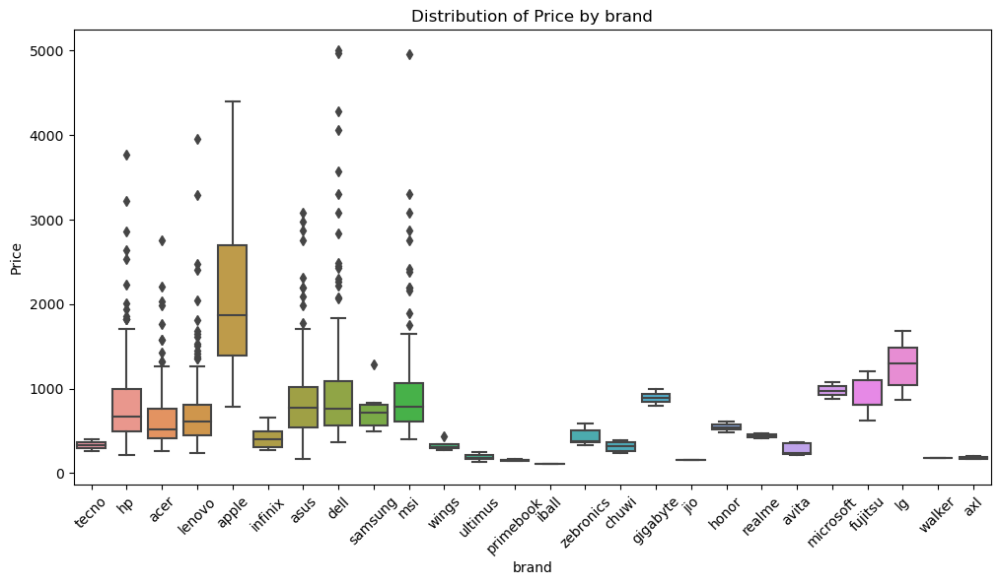

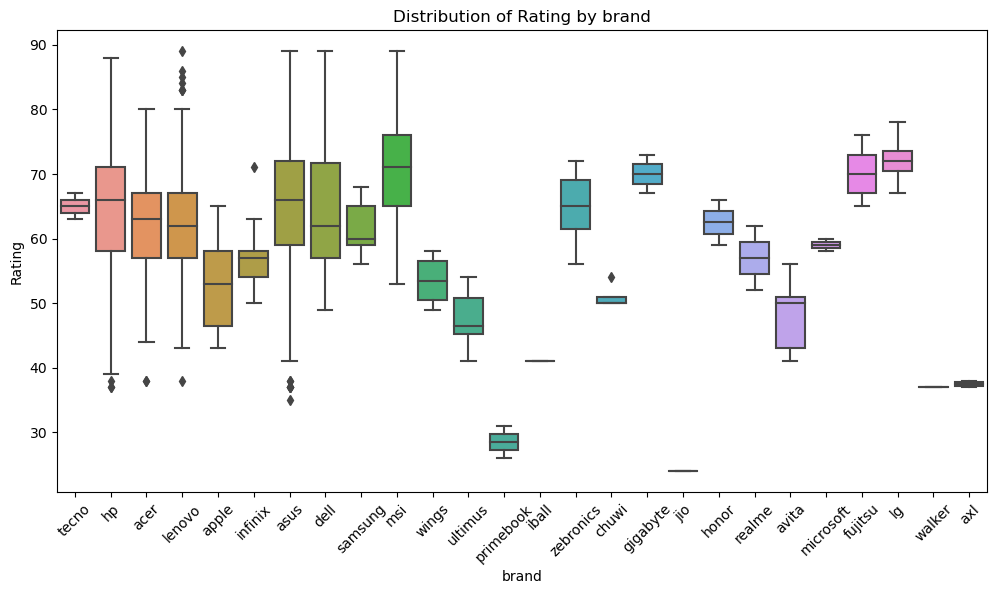

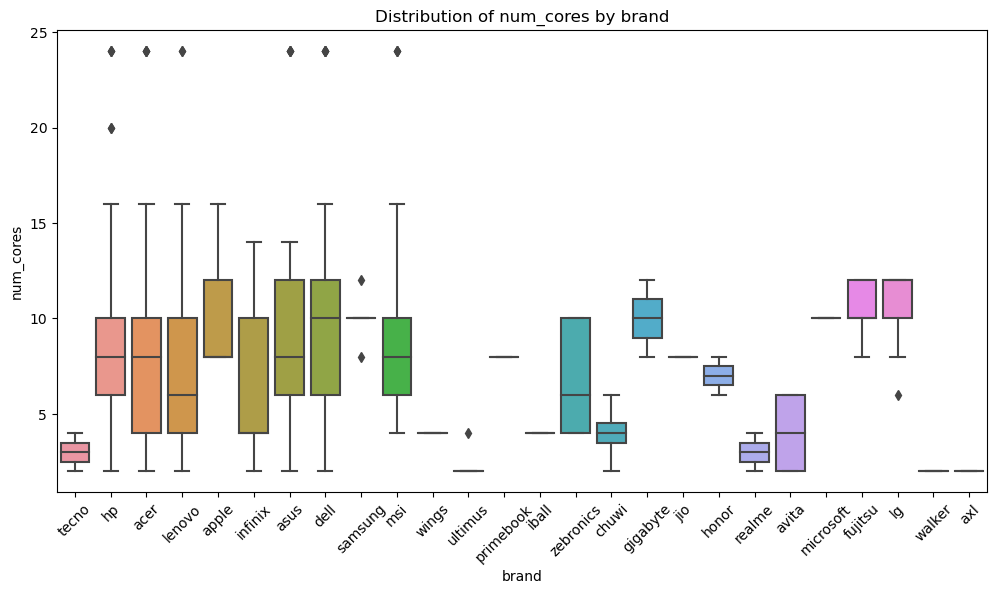

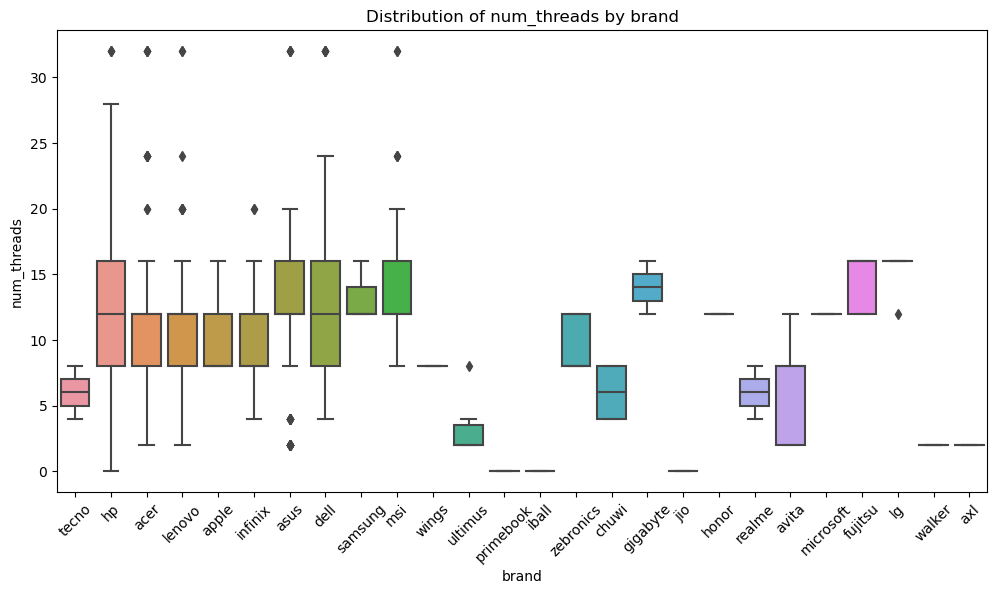

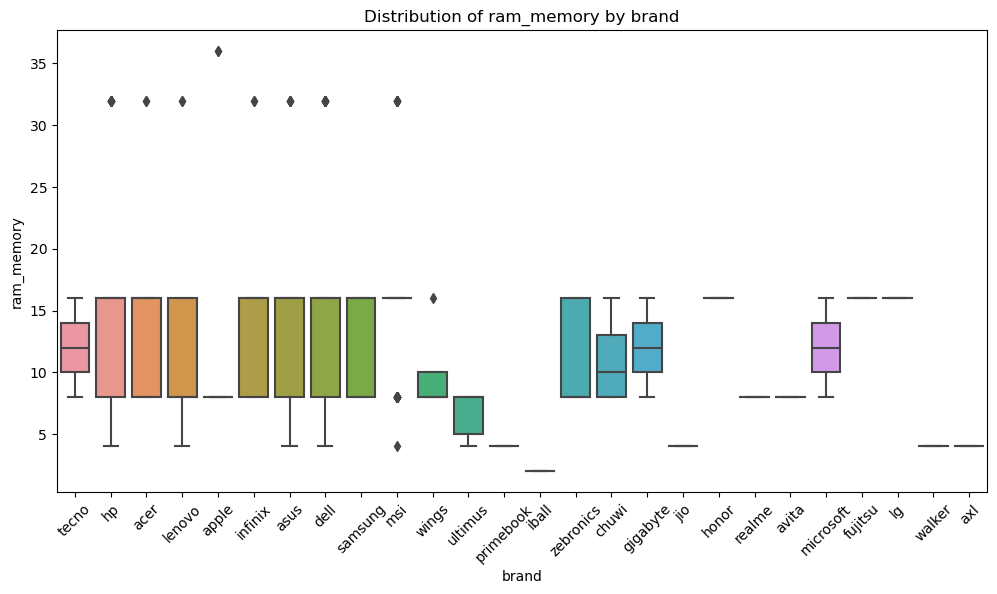

...

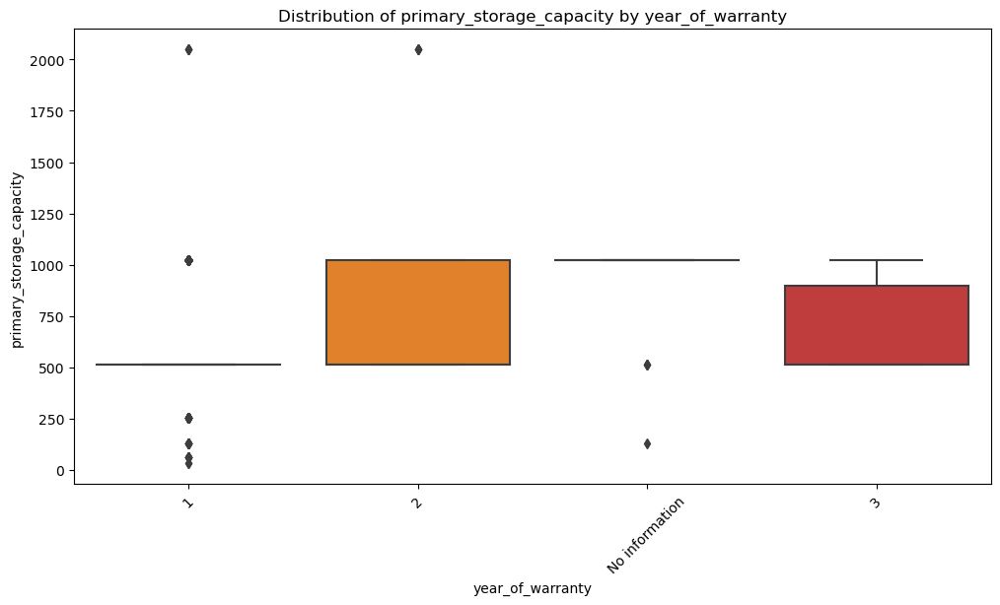

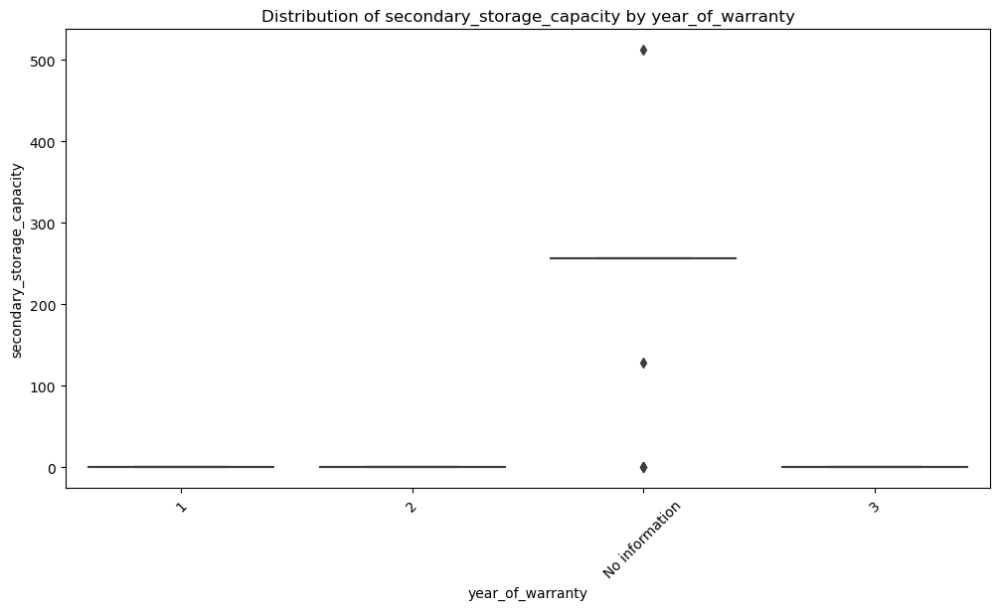

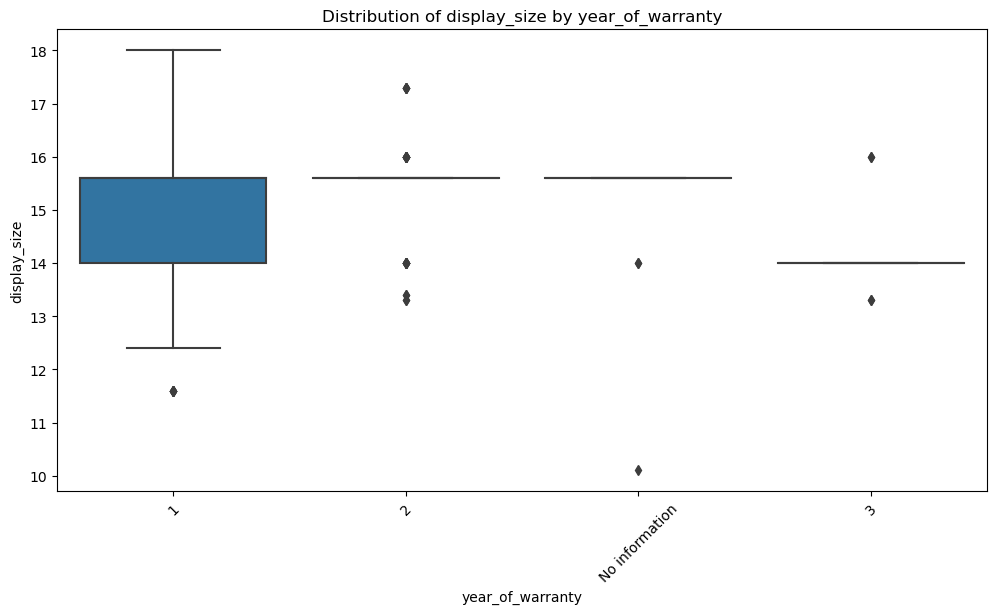

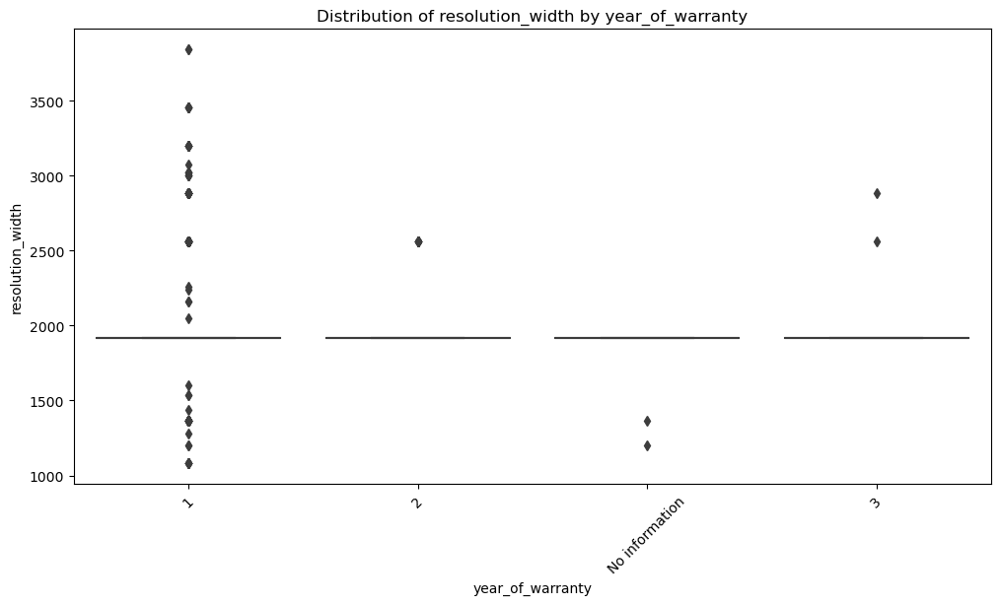

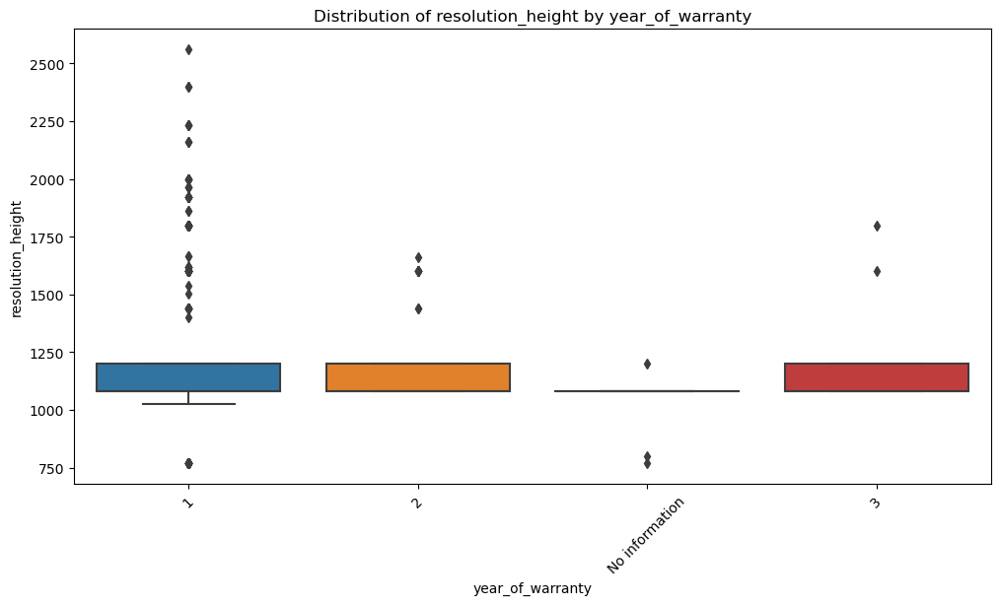

In [102]:
for qual_var in qualitative_vars:
    for quant_var in quantitative_vars:
        plt.figure(figsize=(12, 6))  # Définir la taille de la figure
        sns.boxplot(x=qual_var, y=quant_var, data=data)
        plt.title(f'Distribution of {quant_var} by {qual_var}')
        plt.xticks(rotation=45)  # Rotation des labels pour une meilleure lisibilité
        plt.show()


### 6- Réaliser une analyse multidimensionnel ACP.

In [106]:
# Supposer que nous excluons les variables catégorielles pour l'exemple
numeric_data = data.select_dtypes(include=[np.number])

# Normalisation des données
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric_data)

# Créer un objet PCA. Le nombre de composantes principales est à choisir
pca = PCA(n_components=2)  # Ici, nous demandons les deux premières composantes principales

# Ajuster et transformer les données
principal_components = pca.fit_transform(numeric_scaled)

# Créer un DataFrame pour les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])


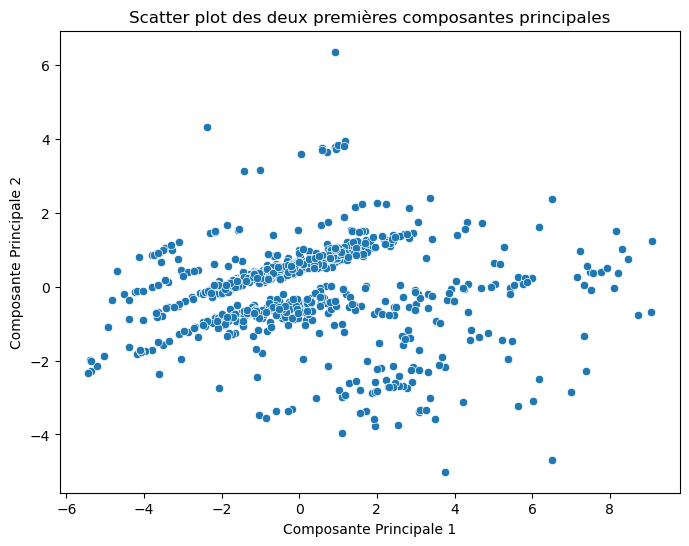

In [107]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, palette='viridis')
plt.title('Scatter plot des deux premières composantes principales')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.show()

In [108]:
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=numeric_data.columns)
print(loadings)


                                 PC1       PC2
Price                       0.392214 -0.067966
Rating                      0.362500  0.240890
num_cores                   0.369093  0.034741
num_threads                 0.391219  0.159800
ram_memory                  0.338180  0.055080
primary_storage_capacity    0.320211  0.182417
secondary_storage_capacity  0.003409  0.356636
display_size                0.129090  0.560799
resolution_width            0.316606 -0.426910
resolution_height           0.302762 -0.500363


In [109]:
explained_variance = pca.explained_variance_ratio_
print(f"Variance expliquée par les deux premières composantes: {explained_variance}")


Variance expliquée par les deux premières composantes: [0.51428888 0.13025781]


### 7 - Opérer des regroupements en classes homogènes d’un ensemble d’individus pour avoir une idée sur les portables qui ont des même caractéristiques (Clustring avant et après ACP).

In [115]:


# Clustering sur les données normalisées
kmeans = KMeans(n_clusters=3, random_state=42)  # Choisir le nombre de clusters approprié
clusters = kmeans.fit_predict(numeric_scaled)

# Ajouter les étiquettes de cluster au DataFrame original
data['Cluster'] = clusters

In [116]:
# Clustering sur les données réduites par ACP
kmeans_pca = KMeans(n_clusters=3, random_state=42)
clusters_pca = kmeans_pca.fit_predict(data_pca)

# Ajouter les étiquettes de cluster post-ACP au DataFrame
data['Cluster_PCA'] = clusters_pca


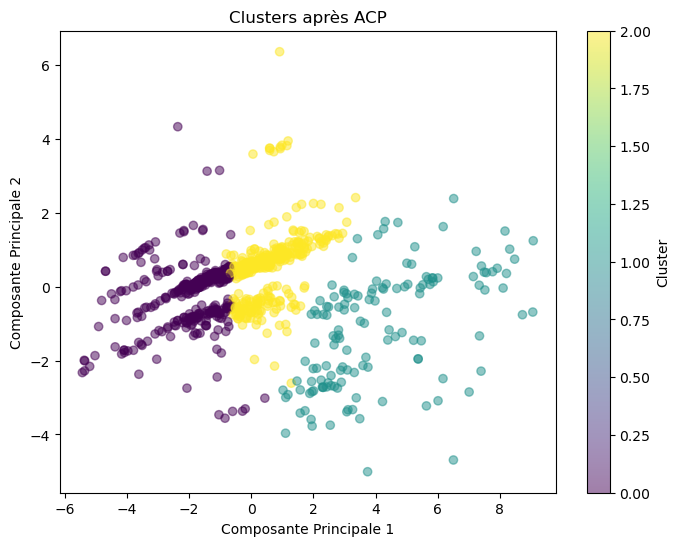

In [117]:
plt.figure(figsize=(8, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=clusters_pca, cmap='viridis', alpha=0.5)
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.title('Clusters après ACP')
plt.colorbar(label='Cluster')
plt.show()


### 8 - Créer un modèle qui peut prédire la valeur de la variable cible Is Touch screen depuis la valeur de plusieurs variables (Arbre de décision).

In [129]:
# Sélectionner uniquement les variables numériques
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
X = data[numeric_columns]

# Assurer que 'Is Touch screen' n'est pas inclus dans les variables explicatives
X = X.drop(['is_touch_screen'], axis=1, errors='ignore')  # Utilisez errors='ignore' pour éviter des erreurs si la colonne n'existe pas

# Définir la variable cible
y = data['is_touch_screen']

# Normalisation des variables numériques
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [130]:
# Créer et entraîner le modèle d'arbre de décision
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

In [133]:
# Évaluer le modèle
y_pred = dt_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print(classification_report(y_test, y_pred))


Accuracy: 0.9346733668341709
              precision    recall  f1-score   support

       False       0.96      0.97      0.96       184
        True       0.57      0.53      0.55        15

    accuracy                           0.93       199
   macro avg       0.77      0.75      0.76       199
weighted avg       0.93      0.93      0.93       199



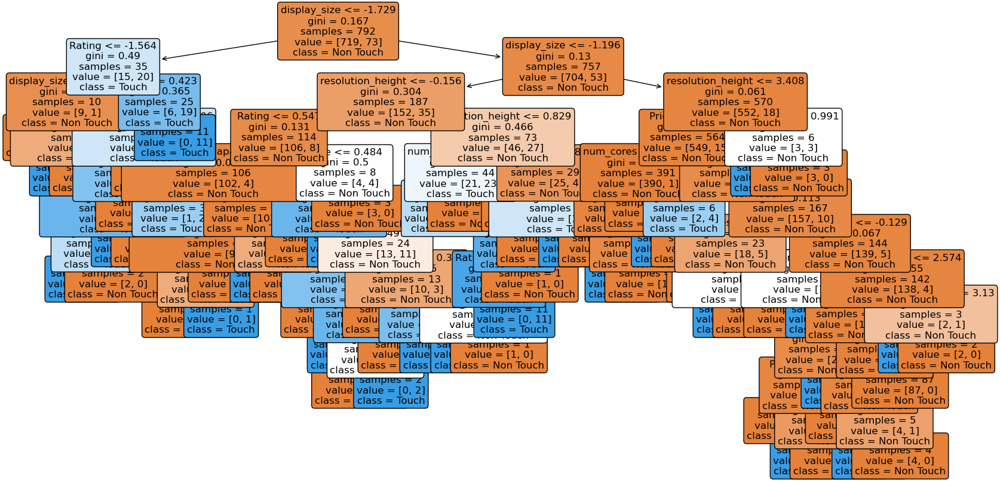

In [134]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Supposons que dt_model est votre modèle d'arbre de décision entraîné
plt.figure(figsize=(20,10))
plot_tree(dt_model, filled=True, feature_names=X.columns, class_names=["Non Touch", "Touch"], rounded=True, fontsize=12)
plt.show()
